# Figure generation scVI
In this notebook figure will be generated of the scVI integration

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)
import warnings
import matplotlib.cbook


/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/bin/python
3.9.18 (main, Sep 11 2023, 13:41:44) 
[GCC 11.2.0]
sys.version_info(major=3, minor=9, micro=18, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt
import scvi
import torch

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

AttributeError: module 'matplotlib.cbook' has no attribute 'mplDeprecation'

In [ ]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/5_integration/data/scvi/models/scvi_model_0')
sc.settings.figdir = '/home/hers_basak/jjiang/jack/outputs/deliverables/5_integration/data/scvi/models/scvi_model_0/'
np.random.seed(41)

In [5]:
nn='100'

In [5]:
files=['/home/hers_basak/jjiang/jack/outputs/deliverables/5_integration/data/complete_label_transferred_filtered.h5ad']
names=['complete']
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i])
    locals()[object_names_merged[i]] = sc.read_h5ad(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_complete  is loaded


In [12]:
adata_complete=adata_complete[adata_complete.obs['harmonized_cell_type_filtered_02_scvi']!='Unknown']

In [7]:
adata_complete

AnnData object with n_obs × n_vars = 522220 × 4000
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_Library', 'original_Brain_Region', 'original_Level_1_cell_type', 'original_Level_2_cell_type', 'original_cellclass_lvl1', 'original_subclass_lvl3_1', 'original_cellclass_lvl1_n', 'original_lineage', 'original_subclass_lvl2', 'original_celltype_lvl3', 'donor', 'original_supercluster_term', 'original_cluster_id', 'original_subcluster_id', 'original_celltype', 'cell_type_lvl1', 'cell_type_lvl2', 'cell_type_lvl3', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_type_low_res', 'cell_type_high_res', 'harmonized_cell_type', 'harmonized_cell_

/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


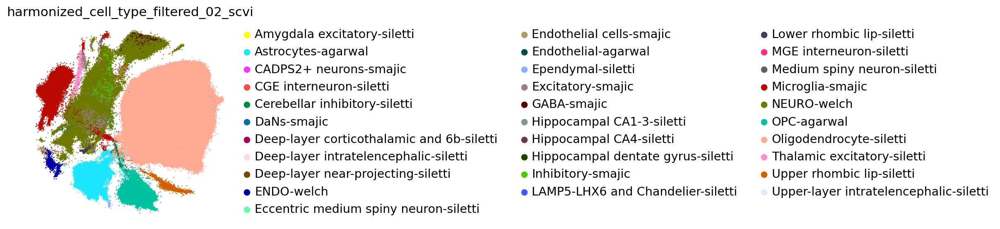

In [13]:
sc.pl.embedding(
    adata_complete,
    basis='X_scVI_MDE',
    color=["harmonized_cell_type_filtered_02_scvi"],
    frameon=False,
    ncols=1,
    size=5,
    show=False
)

plt.savefig(f"./adata_n30_scvi_low_res.png", bbox_inches="tight")

/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd

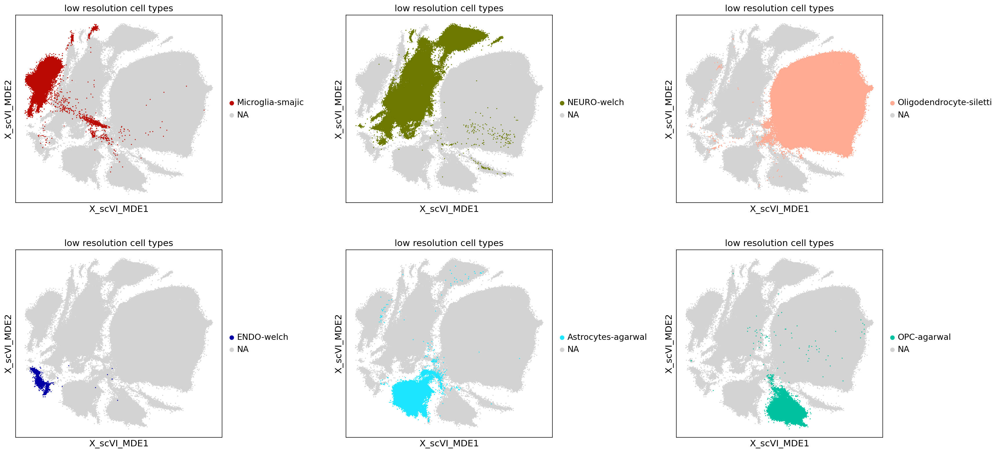

In [23]:
feature1='harmonized_cell_type_filtered_02_scvi'
title1='low resolution cell types'
nn='30'
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.6, hspace=0.25)
sc.pl.embedding(adata_complete, color=feature1, groups= 'Microglia-smajic', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1,basis='X_scVI_MDE')
sc.pl.embedding(adata_complete, color=feature1, groups= 'NEURO-welch', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1,basis='X_scVI_MDE')
sc.pl.embedding(adata_complete, color=feature1, groups= 'Oligodendrocyte-siletti', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1,basis='X_scVI_MDE')
sc.pl.embedding(adata_complete, color=feature1, groups= 'ENDO-welch', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1,basis='X_scVI_MDE')
sc.pl.embedding(adata_complete, color=feature1, groups= 'Astrocytes-agarwal', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1,basis='X_scVI_MDE')
sc.pl.embedding(adata_complete, color=feature1, groups= 'OPC-agarwal', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1,basis='X_scVI_MDE')
fig.savefig(f'./adata_n{nn}_low_subplots.png',bbox_inches='tight')

In [5]:
sc.pp.normalize_total(adata_complete, key_added='total_counts_norm',target_sum=10000)
sc.pp.log1p(adata_complete)


In [27]:
print(adata_complete.X)

  (0, 2313)	2
  (0, 349)	6
  (0, 2597)	13
  (0, 2588)	2
  (0, 2248)	6
  (0, 1090)	2
  (0, 1216)	2
  (0, 2859)	3
  (0, 2836)	1
  (0, 1140)	2
  (0, 1744)	2
  (0, 723)	16
  (0, 725)	27
  (0, 724)	37
  (0, 1503)	2
  (0, 1519)	2
  (0, 2484)	1
  (0, 1921)	4
  (0, 2474)	5
  (0, 1245)	1
  (0, 1513)	8
  (0, 2336)	2
  (0, 1669)	11
  (0, 1014)	6
  (0, 978)	2
  :	:
  (522218, 2896)	1
  (522219, 49)	1
  (522219, 1879)	2
  (522219, 158)	1
  (522219, 1570)	2
  (522219, 2690)	4
  (522219, 1918)	1
  (522219, 1737)	1
  (522219, 1152)	1
  (522219, 1924)	1
  (522219, 1487)	1
  (522219, 2433)	1
  (522219, 1772)	1
  (522219, 2340)	1
  (522219, 1916)	9
  (522219, 1008)	1
  (522219, 2908)	1
  (522219, 2204)	2
  (522219, 2126)	1
  (522219, 2993)	1
  (522219, 2389)	2
  (522219, 707)	1
  (522219, 2834)	1
  (522219, 669)	2
  (522219, 2285)	2


In [6]:
sc.pp.highly_variable_genes(
    adata_complete,
    n_top_genes=2000,
    batch_key="atlas",
    subset=True)

/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:215: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:215: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/home/hers_basak/jjiang/jack/miniconda/envs/scarches2/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:215: FutureWarning: T

In [7]:
adata_complete.X = adata_complete.raw[:, adata_complete.var_names].X
adata_complete.layers['counts']=adata_complete.X.copy()
adata_complete.write('/home/hers_basak/jjiang/jack/outputs/deliverables/5_integration/data/complete_base_hvg2k.h5ad')


In [6]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/5_integration/data/scvi/models/scvi_model_0/'
files=[f'{path}adata_n{nn}.h5ad']
names=[f'n{nn}']
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i])
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_n100  is loaded


/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
SCVI_MDE_KEY="X_scVI_MDE"

# No integration

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


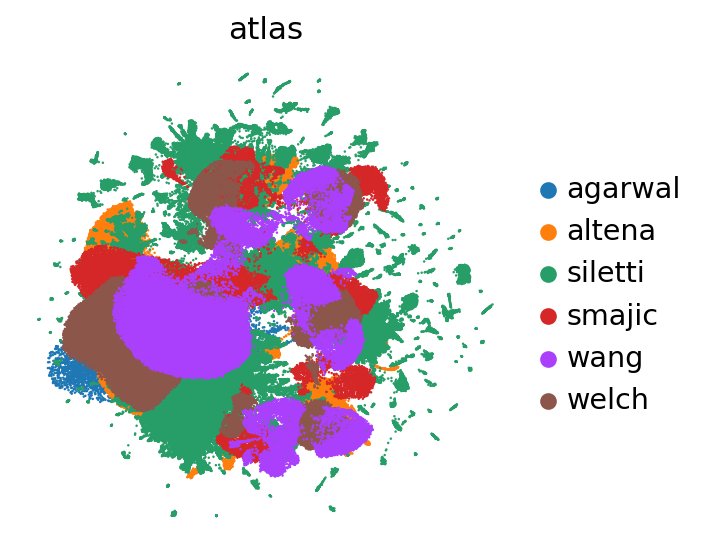

In [32]:
sc.pl.umap(adata_n15, color=['atlas'], show=False,frameon=False,
               use_raw=False, s=5, wspace=0.5)
plt.savefig(f"./adata_n{nn}_none_atlas.png", bbox_inches="tight")

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-

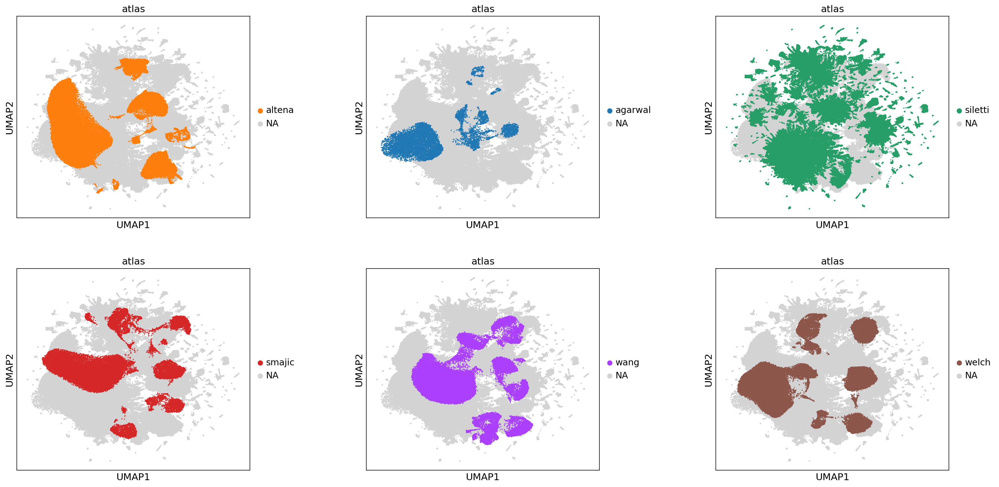

In [11]:
feature1='atlas'
title1='atlas'
nn='15'
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_n15, color=feature1, groups= 'altena', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
sc.pl.umap(adata_n15, color=feature1, groups= 'agarwal', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
sc.pl.umap(adata_n15, color=feature1, groups= 'siletti', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
sc.pl.umap(adata_n15, color=feature1, groups= 'smajic', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
sc.pl.umap(adata_n15, color=feature1, groups= 'wang', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
sc.pl.umap(adata_n15, color=feature1, groups= 'welch', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
fig.savefig(f'./adata_n{nn}_none_subplots.png',bbox_inches='tight')

# N15

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


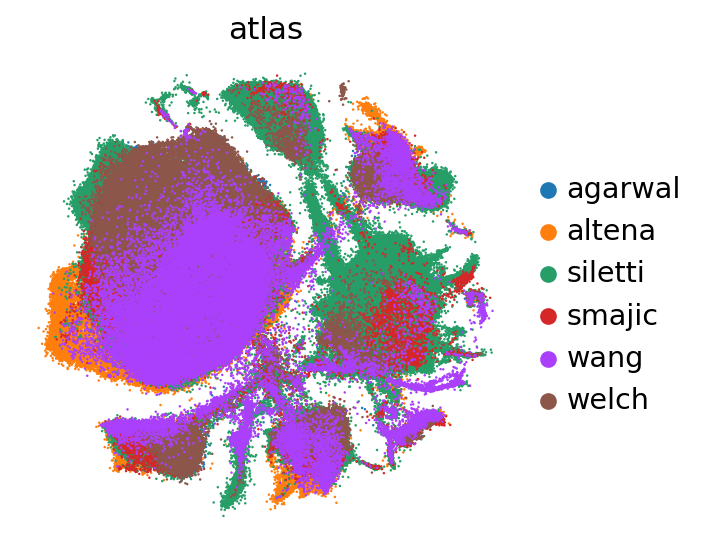

In [30]:

sc.pl.embedding(
    adata_n15,
    basis=SCVI_MDE_KEY,
    color=["atlas"],
    frameon=False,
    ncols=1,
    size=5,
    show=False
)

plt.savefig(f"./adata_n{nn}_scvi_atlas.png", bbox_inches="tight")

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/hers_basak/jjiang/

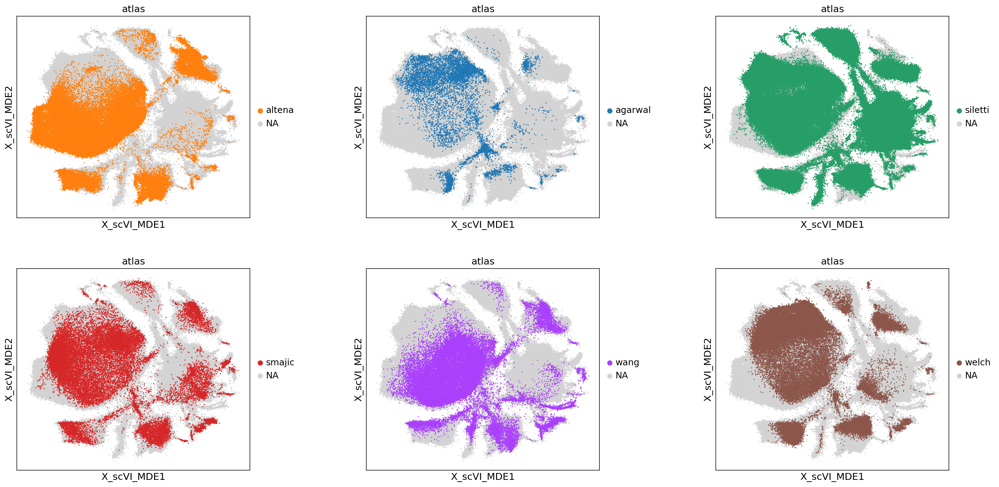

In [8]:
feature1='atlas'
title1='atlas'
nn='15'
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.embedding(adata_n15, color=feature1, groups= 'altena', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n15, color=feature1, groups= 'agarwal', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n15, color=feature1, groups= 'siletti', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n15, color=feature1, groups= 'smajic', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n15, color=feature1, groups= 'wang', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n15, color=feature1, groups= 'welch', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1,basis=SCVI_MDE_KEY)
fig.savefig(f'./adata_n{nn}_scvi_subplots.png',bbox_inches='tight')

# N30

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


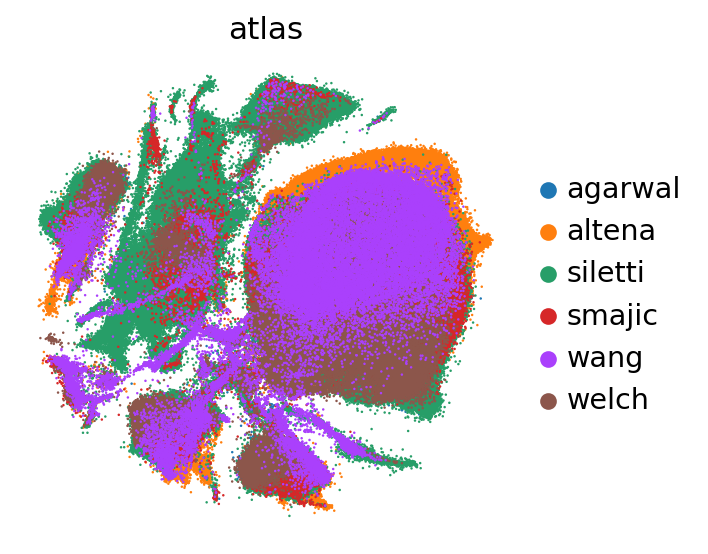

In [7]:

sc.pl.embedding(
    adata_n30,
    basis=SCVI_MDE_KEY,
    color=["atlas"],
    frameon=False,
    ncols=1,
    size=5,
    show=False
)

plt.savefig(f"./adata_n{nn}_scvi_atlas.png", bbox_inches="tight")

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-

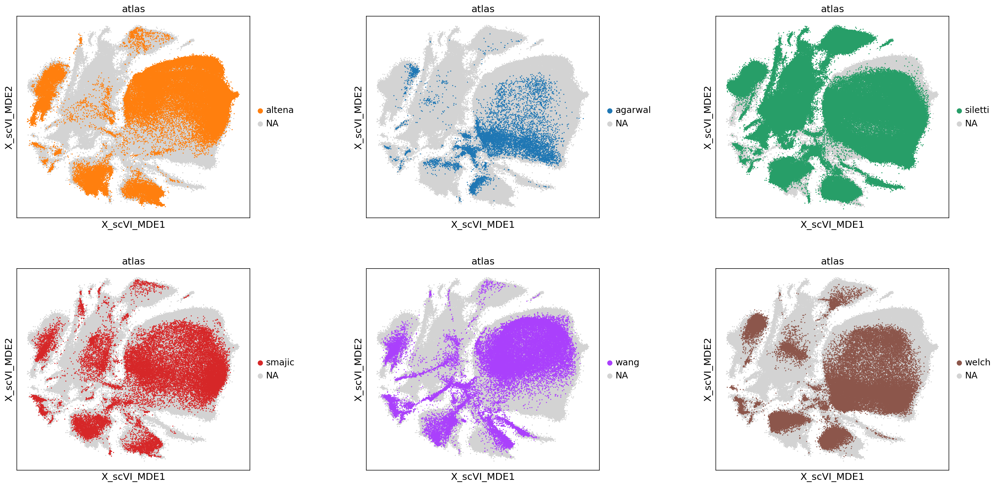

In [10]:
feature1='atlas'
title1='atlas'
nn='30'
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.embedding(adata_n30, color=feature1, groups= 'altena', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n30, color=feature1, groups= 'agarwal', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n30, color=feature1, groups= 'siletti', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n30, color=feature1, groups= 'smajic', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n30, color=feature1, groups= 'wang', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n30, color=feature1, groups= 'welch', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1,basis=SCVI_MDE_KEY)
fig.savefig(f'./adata_n{nn}_scvi_subplots.png',bbox_inches='tight')

# N50

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


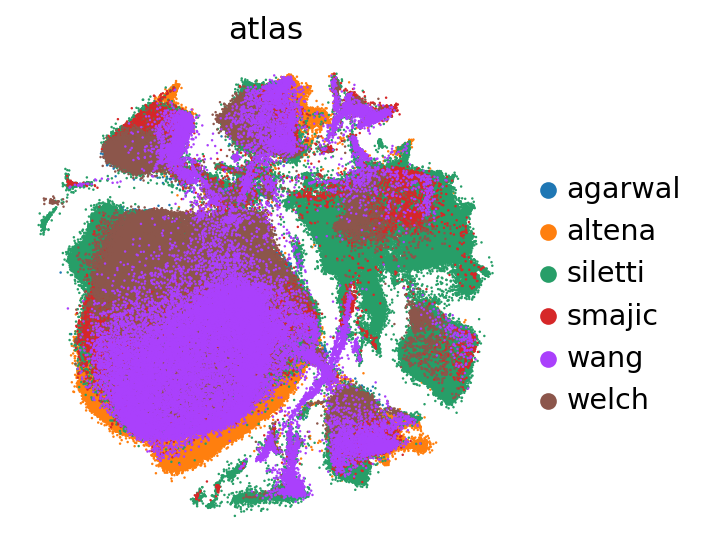

In [9]:

sc.pl.embedding(
    adata_n50,
    basis=SCVI_MDE_KEY,
    color=["atlas"],
    frameon=False,
    ncols=1,
    size=5,
    show=False
)

plt.savefig(f"./adata_n{nn}_scvi_atlas.png", bbox_inches="tight")

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-

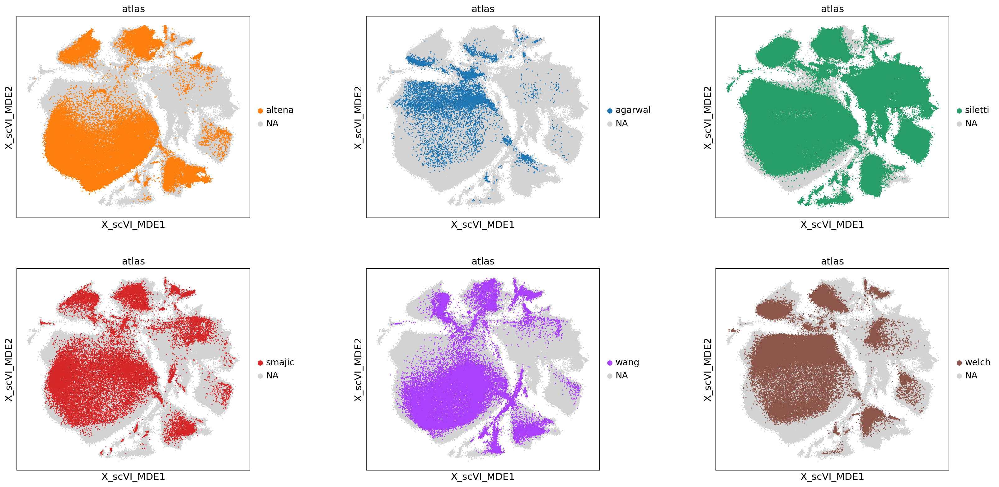

In [10]:
feature1='atlas'
title1='atlas'
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.embedding(adata_n50, color=feature1, groups= 'altena', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n50, color=feature1, groups= 'agarwal', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n50, color=feature1, groups= 'siletti', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n50, color=feature1, groups= 'smajic', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n50, color=feature1, groups= 'wang', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n50, color=feature1, groups= 'welch', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1,basis=SCVI_MDE_KEY)
fig.savefig(f'./adata_n{nn}_scvi_subplots.png',bbox_inches='tight')

# N100

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


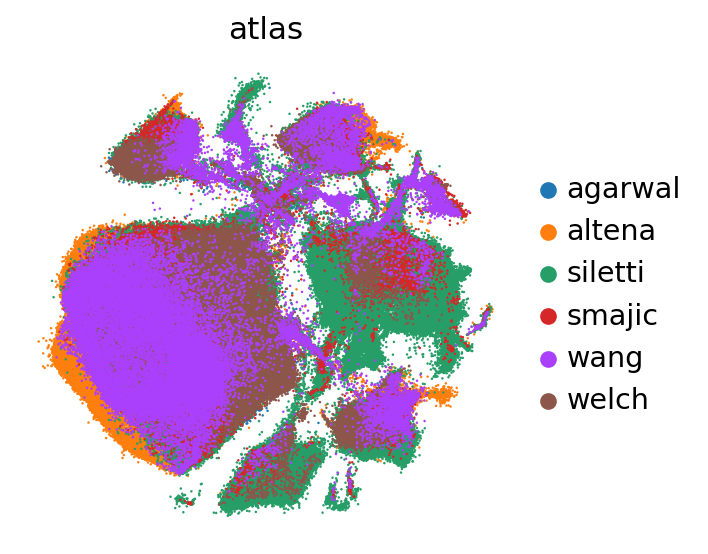

In [8]:

sc.pl.embedding(
    adata_n100,
    basis=SCVI_MDE_KEY,
    color=["atlas"],
    frameon=False,
    ncols=1,
    size=5,
    show=False
)

plt.savefig(f"./adata_n{nn}_scvi_atlas.png", bbox_inches="tight")

/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/hers_basak/jjiang/jack/miniconda/envs/scarches/lib/python3.9/site-

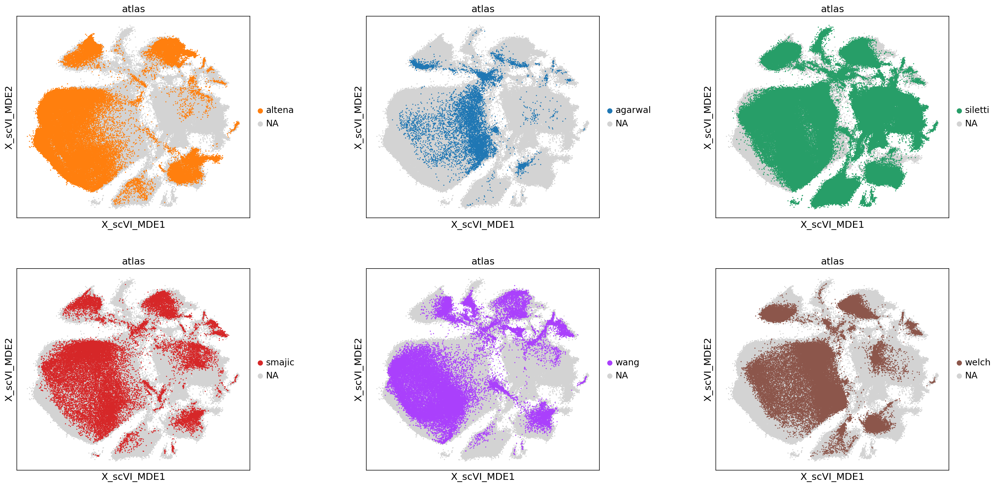

In [9]:
feature1='atlas'
title1='atlas'
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.embedding(adata_n100, color=feature1, groups= 'altena', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n100, color=feature1, groups= 'agarwal', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n100, color=feature1, groups= 'siletti', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n100, color=feature1, groups= 'smajic', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n100, color=feature1, groups= 'wang', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1,basis=SCVI_MDE_KEY)
sc.pl.embedding(adata_n100, color=feature1, groups= 'welch', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1,basis=SCVI_MDE_KEY)
fig.savefig(f'./adata_n{nn}_scvi_subplots.png',bbox_inches='tight')